In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sunpy
import sunpy.map
from sunpy.coordinates import (get_earth, get_horizons_coord,
                                Helioprojective, propagate_with_solar_surface)
import sunkit_image
import sunkit_image.coalignment as coalignment
import astropy
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as const
import eispac

import cmcrameri.cm as cmcm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (AutoLocator, AutoMinorLocator, 
    FixedLocator, FixedFormatter, LogLocator, StrMethodFormatter)

from astropy.visualization import (AsinhStretch, LinearStretch,
        LogStretch, ImageNormalize)
import os
from sun_blinker import SunBlinker

In [2]:
def plot_colorbar(im, ax, width="3%", height="100%",loc="lower left",fontsize=14,
                  bbox_to_anchor=(1.02, 0., 1, 1),orientation="vertical"):
    clb_ax = inset_axes(ax,width=width,height=height,loc=loc,
                bbox_to_anchor=bbox_to_anchor,
                 bbox_transform=ax.transAxes,
                 borderpad=0)
    clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)
    clb_ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    clb_ax.yaxis.get_offset_text().set_fontsize(fontsize)
    clb_ax.tick_params(labelsize=fontsize)
    return clb, clb_ax

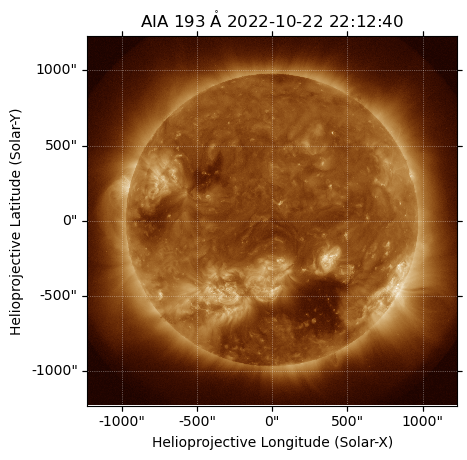

In [3]:
aia_193_map_eis = sunpy.map.Map("../../src/AIA/20221022/193/lvl15/aia_lev15_193a_2022_10_22t22_12_40_84z_image_lev15.fits")
aia_193_map_eis.plot()

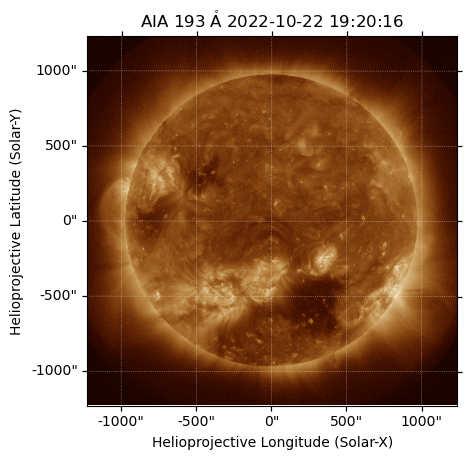

In [4]:
aia_193_map = sunpy.map.Map("../../src/AIA/20221022/193/lvl1/aia_lev1_193a_2022_10_22t19_20_16_83z_image_lev1.fits")
aia_193_map.plot()

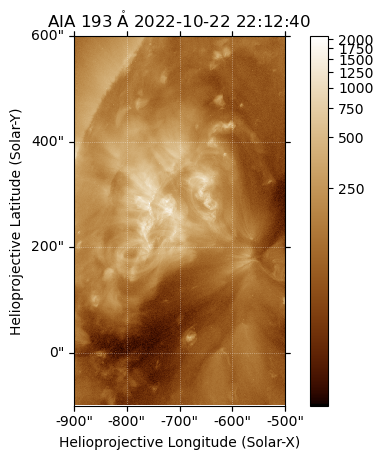

In [5]:
aia_193_map_eis_crop = aia_193_map_eis.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_193_map_eis.coordinate_frame),
                                        top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_193_map_eis.coordinate_frame))
aia_193_map_eis_crop.plot()
plt.colorbar()

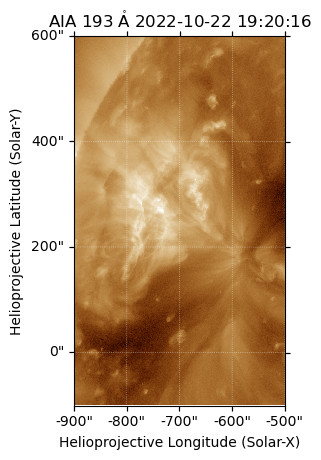

In [6]:
aia_193_map_crop = aia_193_map.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_193_map.coordinate_frame),
                                        top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_193_map.coordinate_frame))
aia_193_map_crop.plot()

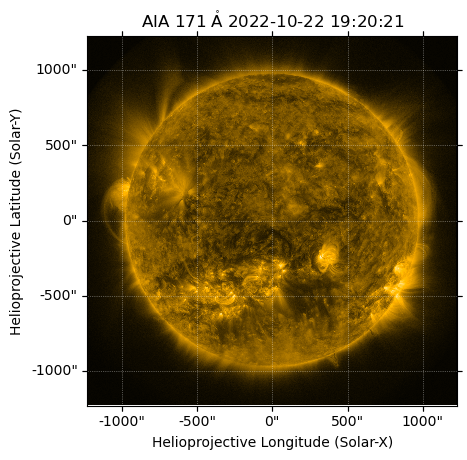

In [7]:
aia_171_map = sunpy.map.Map("../../src/AIA/20221022/171/lvl15/aia_lev15_171a_2022_10_22t19_20_21_34z_image_lev15.fits")
aia_171_map.plot()

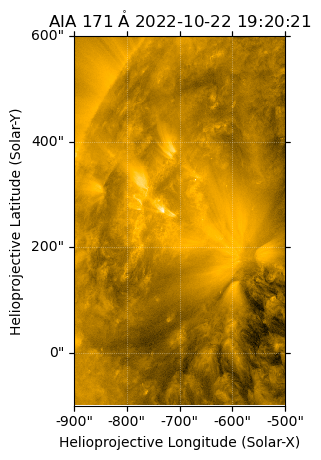

In [8]:
aia_171_map_crop = aia_171_map.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_171_map.coordinate_frame),
                                        top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_171_map.coordinate_frame))
aia_171_map_crop.plot()

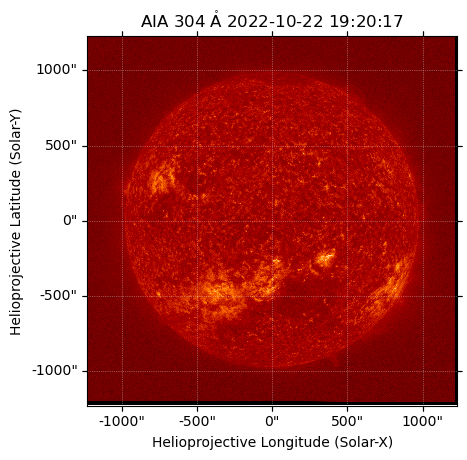

In [9]:
aia_304_map = sunpy.map.Map("../../src/AIA/20221022/304/lvl15/aia_lev15_304a_2022_10_22t19_20_17_13z_image_lev15.fits")
aia_304_map.plot()

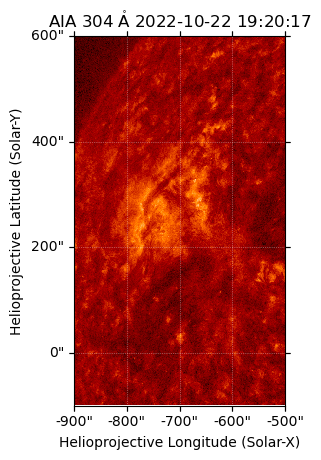

In [10]:
aia_304_map_crop = aia_304_map.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_304_map.coordinate_frame),
                                        top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_304_map.coordinate_frame))
aia_304_map_crop.plot()

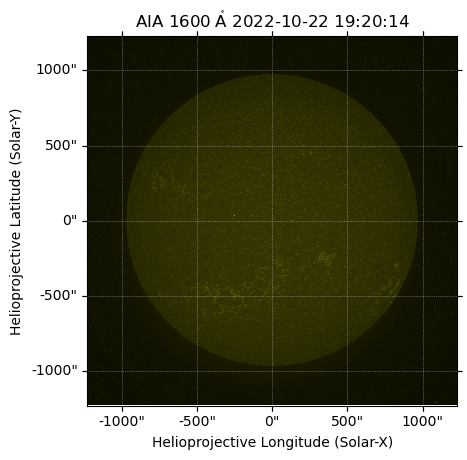

In [11]:
aia_1600_map = sunpy.map.Map("../../src/AIA/20221022/1600/lvl15/aia_lev15_1600a_2022_10_22t19_20_14_13z_image_lev15.fits")
aia_1600_map.plot()

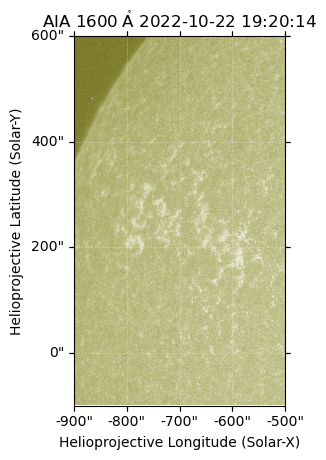

In [12]:
aia_1600_map_crop = aia_1600_map.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_1600_map.coordinate_frame),
                                        top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_1600_map.coordinate_frame))
aia_1600_map_crop.plot()

In [13]:
aia_304_map_arcutout = aia_304_map.submap(SkyCoord(-800*u.arcsec,100*u.arcsec,frame=aia_304_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,500*u.arcsec,frame=aia_304_map.coordinate_frame))

aia_171_map_arcutout = aia_171_map.submap(SkyCoord(-800*u.arcsec,100*u.arcsec,frame=aia_171_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,500*u.arcsec,frame=aia_171_map.coordinate_frame))

aia_193_map_arcutout = aia_193_map.submap(SkyCoord(-800*u.arcsec,100*u.arcsec,frame=aia_193_map.coordinate_frame),  
                                        top_right=SkyCoord(-600*u.arcsec,500*u.arcsec,frame=aia_193_map.coordinate_frame))

aia_1600_map_arcutout = aia_1600_map.submap(SkyCoord(-800*u.arcsec,100*u.arcsec,frame=aia_1600_map.coordinate_frame),
                                        top_right=SkyCoord(-600*u.arcsec,500*u.arcsec,frame=aia_1600_map.coordinate_frame))

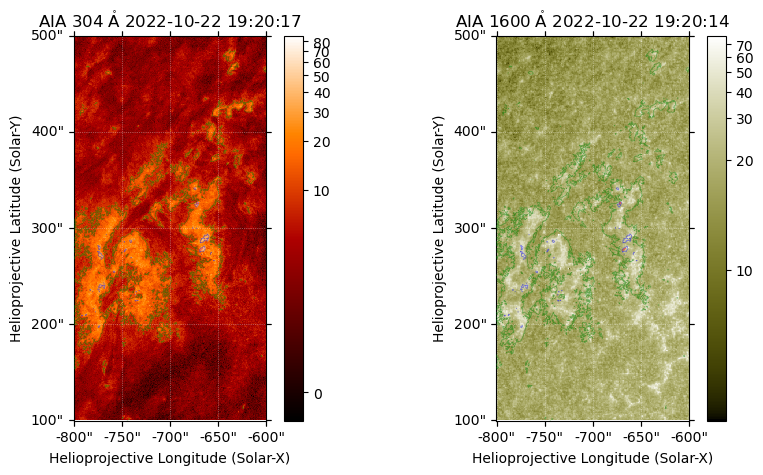

In [14]:
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(121,projection=aia_304_map_arcutout)
im1 = aia_304_map_arcutout.plot()
plt.colorbar(ax=ax1)

ax2 = fig.add_subplot(122,projection=aia_1600_map_arcutout)
im2 = aia_1600_map_arcutout.plot()
plt.colorbar(ax=ax2)

aia_304_levels = [10,30,50]*aia_304_map_crop.unit
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_304_map_crop.draw_contours(levels=aia_304_levels,axes=ax_,colors=["g","b","r"],alpha=0.5,linewidths=0.5)
    ax_.axis(bounds)

In [15]:
def coalign_shift(big_map, small_map):
    yshift, xshift = coalignment._calculate_shift(big_map.data, small_map.data)
    reference_coord = big_map.pixel_to_world(xshift, yshift)
    Txshift = reference_coord.Tx - small_map.bottom_left_coord.Tx
    Tyshift = reference_coord.Ty - small_map.bottom_left_coord.Ty

    return Txshift, Tyshift
    

In [16]:
aia_1600_to_304_Txshift, aia_1600_to_304_Tyshift = coalign_shift(aia_304_map_crop,aia_1600_map.reproject_to(aia_304_map_arcutout.wcs,algorithm="exact"))

In [17]:
aia_1600_map_arcutout_shifted = aia_1600_map_arcutout.shift_reference_coord(aia_1600_to_304_Txshift,aia_1600_to_304_Tyshift)
aia_1600_map_shifted = aia_1600_map.shift_reference_coord(aia_1600_to_304_Txshift,aia_1600_to_304_Tyshift)

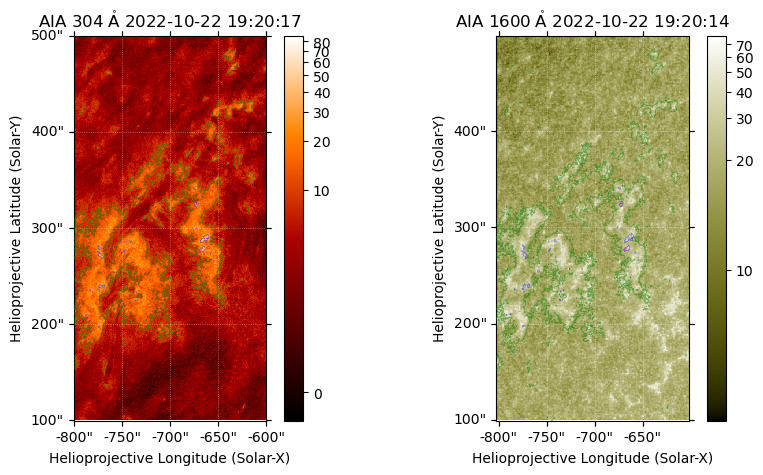

In [18]:
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(121,projection=aia_304_map_arcutout)
im1 = aia_304_map_arcutout.plot()
plt.colorbar(ax=ax1)

ax2 = fig.add_subplot(122,projection=aia_1600_map_arcutout_shifted)
im2 = aia_1600_map_arcutout_shifted.plot()
plt.colorbar(ax=ax2)

aia_304_levels = [10,30,50]*aia_304_map_crop.unit
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_304_map_crop.draw_contours(levels=aia_304_levels,axes=ax_,colors=["g","b","r"],alpha=0.5,linewidths=0.5)
    ax_.axis(bounds)

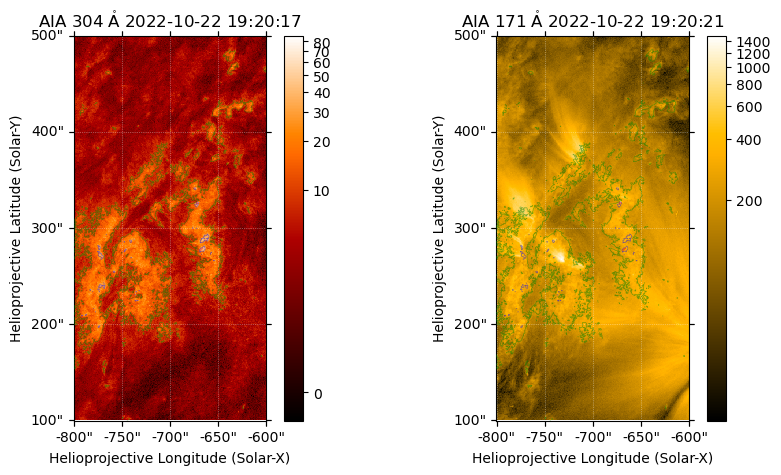

In [19]:
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(121,projection=aia_304_map_arcutout)
im1 = aia_304_map_arcutout.plot()
plt.colorbar(ax=ax1)

ax2 = fig.add_subplot(122,projection=aia_171_map_arcutout)
im2 = aia_171_map_arcutout.plot()
plt.colorbar(ax=ax2)

aia_304_levels = [10,30,50]*aia_304_map_crop.unit
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_304_map_crop.draw_contours(levels=aia_304_levels,axes=ax_,colors=["g","b","r"],alpha=0.5,linewidths=0.5)
    ax_.axis(bounds)

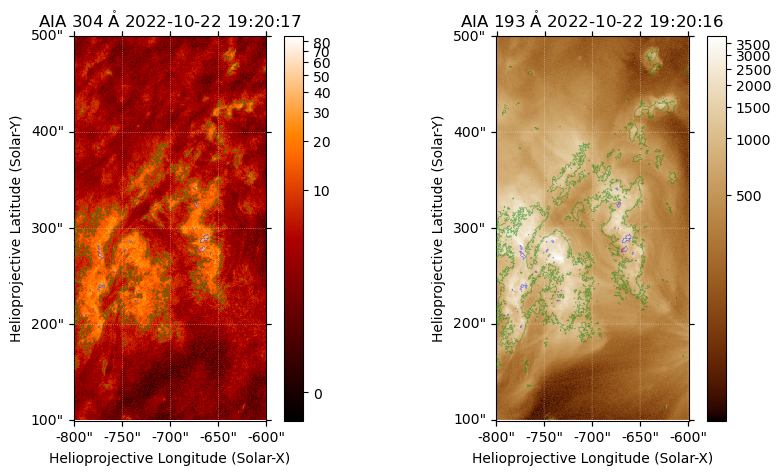

In [20]:
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(121,projection=aia_304_map_arcutout)
im1 = aia_304_map_arcutout.plot()
plt.colorbar(ax=ax1)

ax2 = fig.add_subplot(122,projection=aia_193_map_arcutout)
im2 = aia_193_map_arcutout.plot()
plt.colorbar(ax=ax2)

aia_304_levels = [10,30,50]*aia_304_map_crop.unit
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_304_map_crop.draw_contours(levels=aia_304_levels,axes=ax_,colors=["g","b","r"],alpha=0.5,linewidths=0.5)
    ax_.axis(bounds)

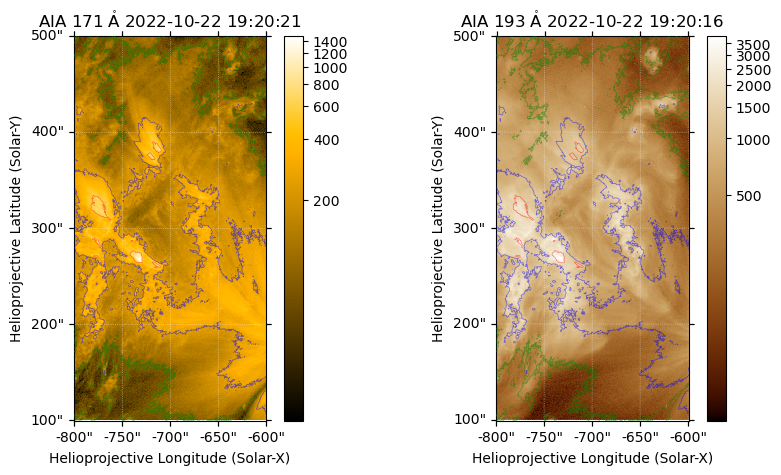

In [21]:
fig = plt.figure(figsize=(10,5))
ax1 = fig.add_subplot(121,projection=aia_171_map_arcutout)
im1 = aia_171_map_arcutout.plot()
plt.colorbar(ax=ax1)

ax2 = fig.add_subplot(122,projection=aia_193_map_arcutout)
im2 = aia_193_map_arcutout.plot()
plt.colorbar(ax=ax2)

aia_171_levels = [100,250,600]*aia_171_map_crop.unit
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_171_map_crop.draw_contours(levels=aia_171_levels,axes=ax_,colors=["g","b","r"],alpha=0.5,linewidths=0.5)
    ax_.axis(bounds)

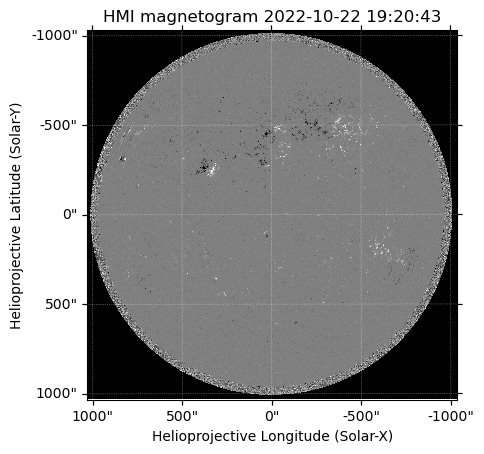

In [22]:
hmi_los_map = sunpy.map.Map("../../src/HMI/20221022/lvl1/hmi.m_45s.2022.10.22_19_21_45_TAI.magnetogram.fits")
hmi_los_map.plot_settings['norm'] = plt.Normalize(-500, 500)
hmi_los_map.plot()

In [23]:
hmi_los_map_to_aia = hmi_los_map.reproject_to(aia_193_map.wcs)

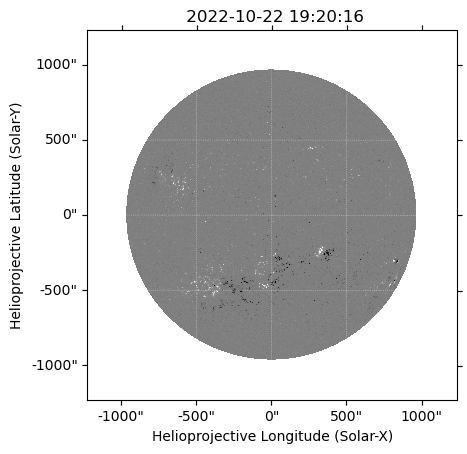

In [24]:
hmi_los_map_to_aia.plot()

See https://docs.sunpy.org/en/stable/code_ref/map.html#fixing-map-metadata for how to fix metadata before loading it with sunpy.map.Map.
See https://fits.gsfc.nasa.gov/fits_standard.html forthe FITS unit standards. [sunpy.map.mapbase]


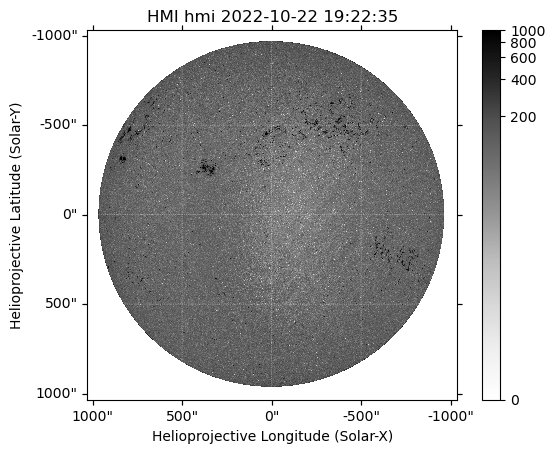

In [25]:
hmi_btot_map = sunpy.map.Map("../../src/HMI/20221022/vectormag/hmi.B_720s.20221022_192400_TAI.field.fits")
hmi_btot_map.plot(norm=ImageNormalize(vmin=0,vmax=1000,stretch=LogStretch()),cmap="Greys")
plt.colorbar()

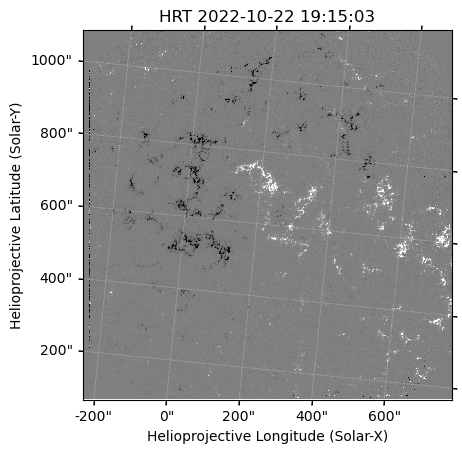

In [26]:
phi_los_map = sunpy.map.Map("../../src/PHI/20221022/solo_L2_phi-hrt-blos_20221022T191503_V01.fits")
phi_los_map.plot_settings['norm'] = plt.Normalize(-500, 500)
phi_los_map.plot()

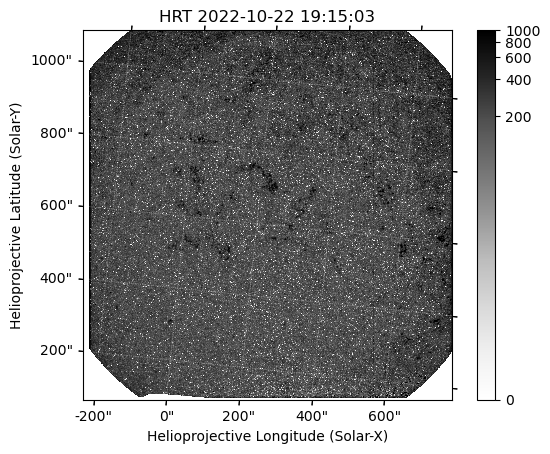

In [27]:
phi_btot_map = sunpy.map.Map("../../src/PHI/20221022/solo_L2_phi-hrt-bmag_20221022T191503_V01.fits")
phi_btot_map.plot(norm=ImageNormalize(vmin=0,vmax=1000,stretch=LogStretch()),cmap="Greys")
plt.colorbar()

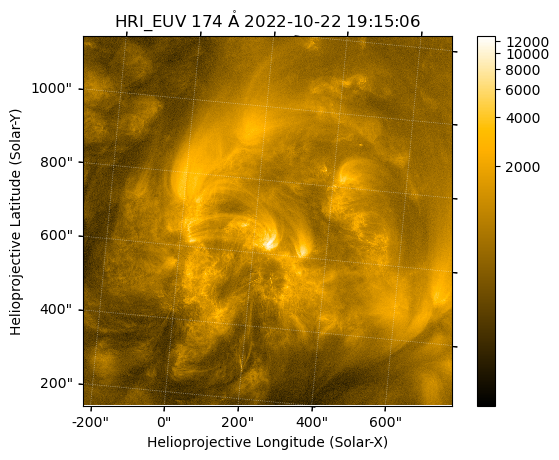

In [28]:
hri_174_map = sunpy.map.Map("../../src/EUI/HRI/euv174/20221022/solo_L2_eui-hrieuv174-image_20221022T191505252_V01.fits")
hri_174_map.plot()
plt.colorbar()

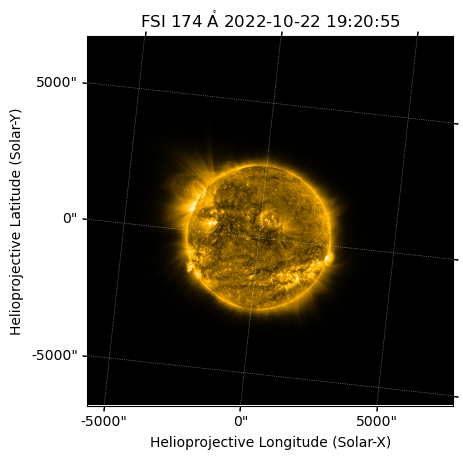

In [29]:
fsi_174_map = sunpy.map.Map("../../src/EUI/FSI/euv174/20221022/solo_L2_eui-fsi174-image_20221022T192050259_V01.fits")
fsi_174_map.plot()

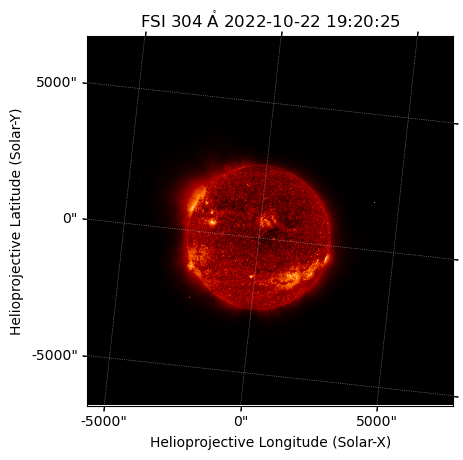

In [30]:
fsi_304_map = sunpy.map.Map("../../src/EUI/FSI/euv304/20221022/solo_L2_eui-fsi304-image_20221022T192020259_V01.fits")
fsi_304_map.plot()

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221022T2140/eis_20221022_214043.fe_12_195_119.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


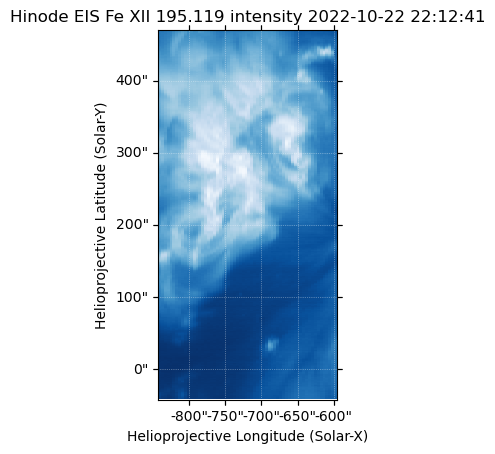

In [31]:
eis_193_fitres = eispac.read_fit("../../src/EIS/DHB_007_v2/20221022T2140/eis_20221022_214043.fe_12_195_119.1c-0.fit.h5")
eis_193_intmap = eis_193_fitres.get_map(component=0,measurement="intensity")
eis_193_intmap.plot()

In [32]:
aia_resample_nx = (aia_193_map_eis_crop.scale.axis1 * aia_193_map_eis_crop.dimensions.x) / eis_193_intmap.scale.axis1
aia_resample_ny = (aia_193_map_eis_crop.scale.axis2 * aia_193_map_eis_crop.dimensions.y) / eis_193_intmap.scale.axis2
aia_193_map_resample = aia_193_map_eis_crop.resample(u.Quantity([aia_resample_nx, aia_resample_ny]))

In [33]:
eis_to_aia_Txshift, eis_to_aia_Tyshift = coalign_shift(aia_193_map_resample,eis_193_intmap)
print(eis_to_aia_Txshift)
print(eis_to_aia_Tyshift)
eis_193_intmap_shift = eis_193_intmap.shift_reference_coord(eis_to_aia_Txshift,eis_to_aia_Tyshift)

3.46629 arcsec
-6.67951 arcsec


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


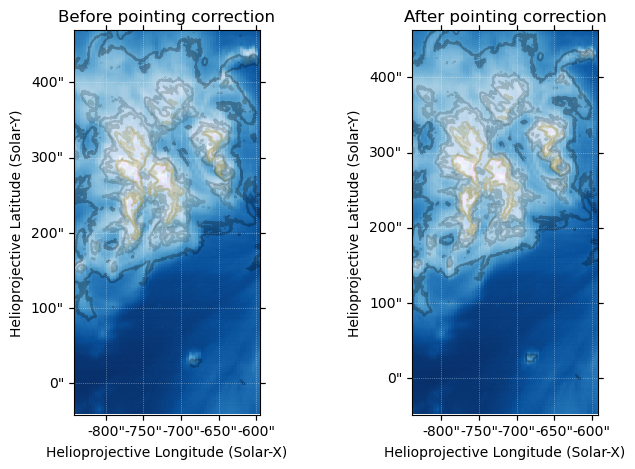

In [34]:
fig = plt.figure(figsize=(8,5))
ax1 = fig.add_subplot(121,projection=eis_193_intmap)
eis_193_intmap.plot(axes=ax1, title='Before pointing correction')

ax2 = fig.add_subplot(122,projection=eis_193_intmap_shift)
eis_193_intmap_shift.plot(axes=ax2, title='After pointing correction')

aia_levels = [200, 400, 500, 700, 800, 1200] * aia_193_map_eis.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_193_map_eis.draw_contours(aia_levels, axes=ax_, cmap=cmcm.batlowK, alpha=0.3)
    ax_.axis(bounds)

In [35]:
with propagate_with_solar_surface():
    aia_193_map_eis_derot = aia_193_map_eis.reproject_to(aia_193_map.wcs)

In [36]:
# aia_193_map_compare = aia_193_map.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_193_map.coordinate_frame),
#                                         top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_193_map.coordinate_frame))

aia_193_map_eis_compare = aia_193_map_eis_derot.submap(SkyCoord(-900*u.arcsec,-100*u.arcsec,frame=aia_193_map_eis_derot.coordinate_frame),
                                        top_right=SkyCoord(-500*u.arcsec,600*u.arcsec,frame=aia_193_map_eis_derot.coordinate_frame))

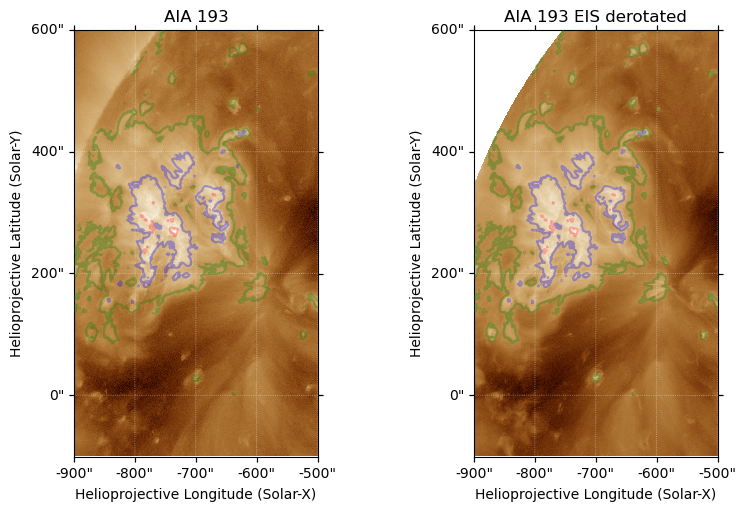

In [37]:
fig = plt.figure(figsize=(8,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_map_crop)
aia_193_map_crop.plot(axes=ax1, title='AIA 193')

ax2 = fig.add_subplot(122,projection=aia_193_map_eis_compare)
aia_193_map_eis_compare.plot(axes=ax2, title='AIA 193 EIS derotated')

aia_levels = [200, 500, 1200] 

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_193_map_eis_compare.draw_contours(aia_levels, axes=ax_, colors=["g","b","r"], alpha=0.3)
    ax_.axis(bounds)

In [38]:
SunBlinker(aia_193_map_crop, aia_193_map_eis_compare)


In [39]:
def derotate_fsi(fsi_map, hri_map,algorithm="adaptive"):
    out_frame = hri_map.coordinate_frame
    out_center = SkyCoord(0*u.arcsec, 0*u.arcsec, frame=out_frame)
    header = sunpy.map.make_fitswcs_header(fsi_map.data.shape,
                                        out_center,
                                        scale=u.Quantity(fsi_map.scale),
                                        rotation_matrix=fsi_map.rotation_matrix)
    out_wcs = WCS(header)

    with propagate_with_solar_surface():
        fsi_map_derot = fsi_map.reproject_to(out_wcs,algorithm=algorithm)

    return fsi_map_derot


In [40]:
fsi_174_map_hri_time = derotate_fsi(fsi_174_map,hri_174_map)

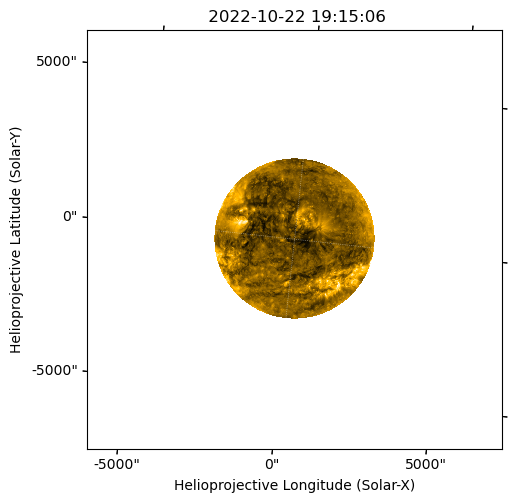

In [41]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax1 = fig.add_subplot(111,projection=fsi_174_map_hri_time)
fsi_174_map_hri_time.plot()

In [42]:
fsi_174_crop = fsi_174_map_hri_time.submap(SkyCoord(-500*u.arcsec,0*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(1000*u.arcsec,1500*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame))

In [43]:
hri_174_map_repro = hri_174_map.reproject_to(fsi_174_crop.wcs)

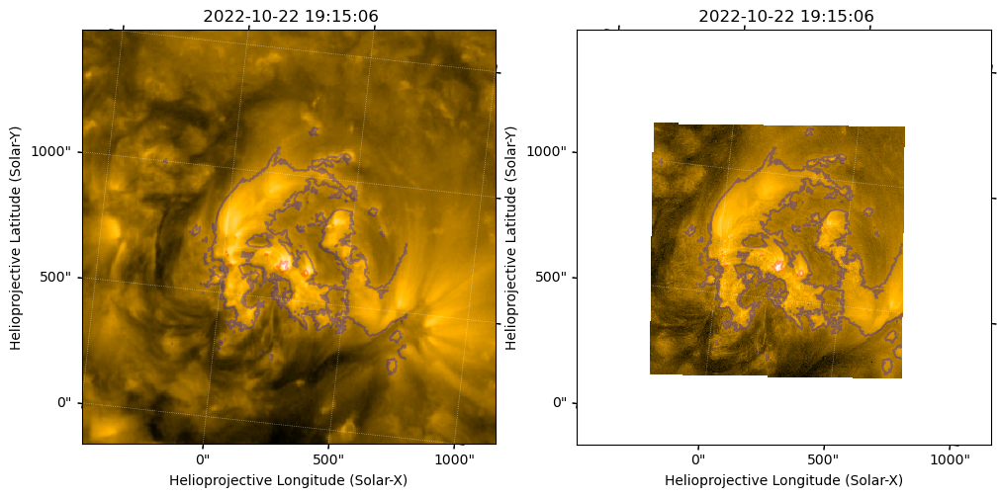

In [44]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()

ax2 = fig.add_subplot(122,projection=hri_174_map_repro)
im2 = hri_174_map_repro.plot()

hri_levels = [1000,5000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_repro.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


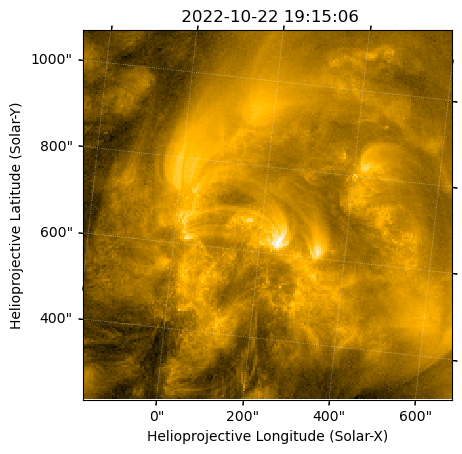

In [45]:
hri_174_map_repro_cut = hri_174_map_repro.submap([79,77]*u.pix,
                                                 top_right=[272,270]*u.pix)
hri_174_map_repro_cut.plot()

In [46]:
Txshift_hri, Tyshift_hri = coalign_shift(fsi_174_crop,hri_174_map_repro_cut)
print(Txshift_hri, Tyshift_hri)

6.60516 arcsec 8.161 arcsec


In [47]:
hri_174_map_repro_shift = hri_174_map_repro.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_repro_cut_shift = hri_174_map_repro_cut.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_shifted = hri_174_map.shift_reference_coord(Txshift_hri,Tyshift_hri)
fsi_174_hri_fov = fsi_174_map_hri_time.reproject_to(hri_174_map_shifted.wcs)

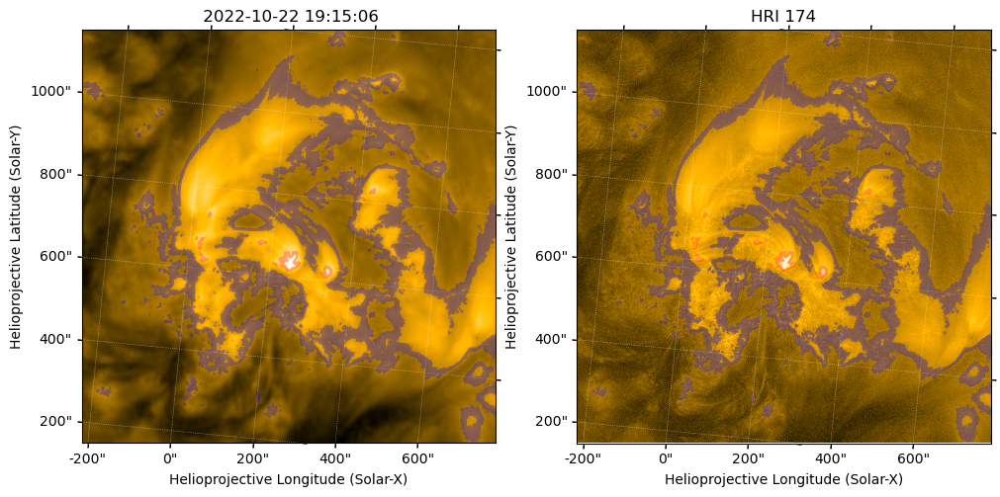

In [48]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_hri_fov)
im1 = fsi_174_hri_fov.plot()

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
ax2.set_title("HRI 174")

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [49]:
SunBlinker(fsi_174_hri_fov, hri_174_map_shifted)

In [50]:
fsi_304_map_hri_time = derotate_fsi(fsi_304_map,hri_174_map)

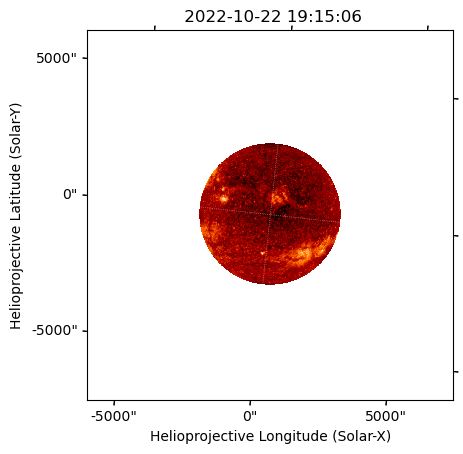

In [51]:
fsi_304_map_hri_time.plot()

In [52]:
fsi_304_crop = fsi_304_map_hri_time.submap(SkyCoord(-500*u.arcsec,0*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(1000*u.arcsec,1500*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame))

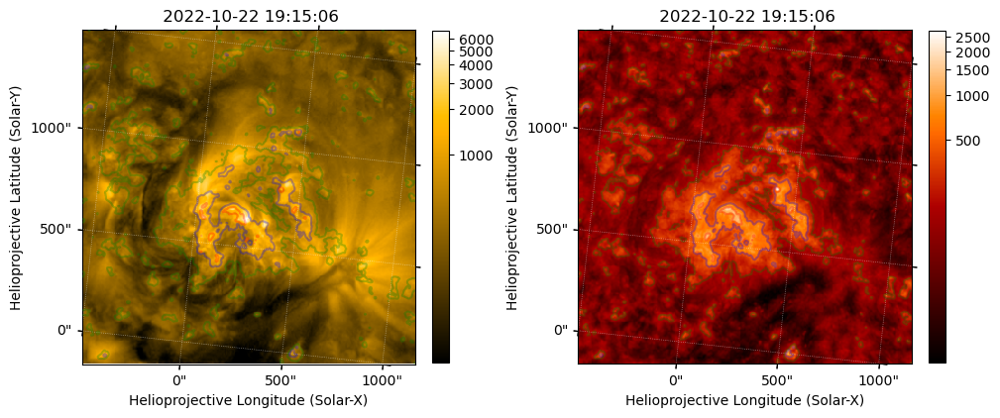

In [53]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [54]:
SunBlinker(fsi_174_crop, fsi_304_crop)

In [55]:
aia_304_map_repro = aia_304_map.reproject_to(fsi_304_crop.wcs)

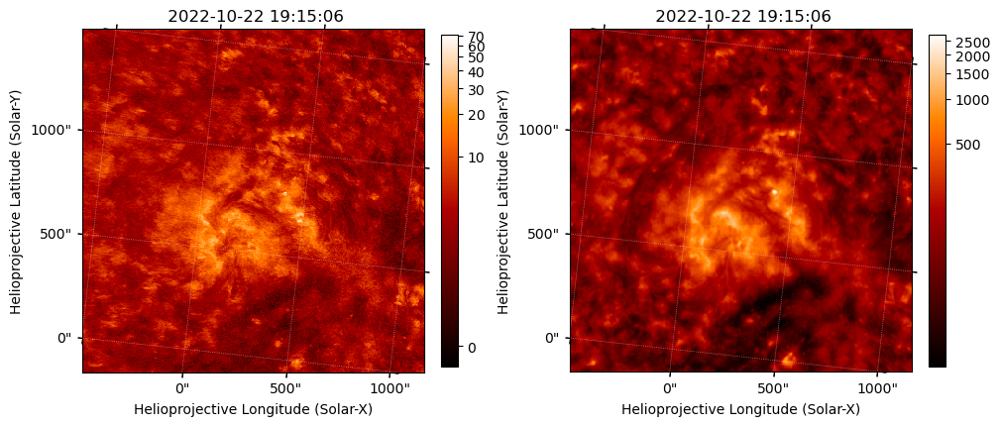

In [56]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro)
im1 = aia_304_map_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

# fsi_304_levels = [200,500,1000]

# for ax_ in (ax1,ax2):
#     bounds = ax_.axis()
#     fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
#     ax_.axis(bounds)


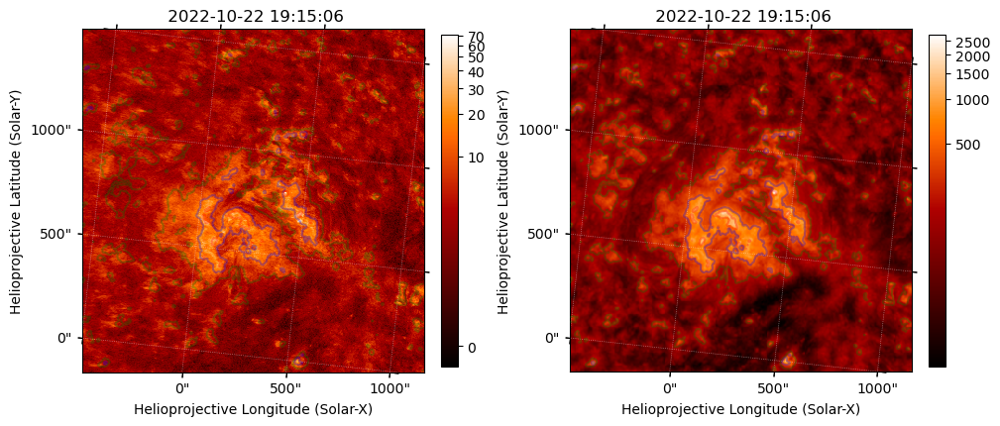

In [57]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro)
im1 = aia_304_map_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


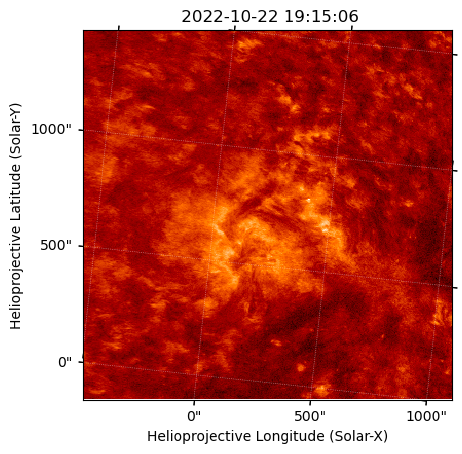

In [81]:
aia_304_map_repro_cut = aia_304_map_repro.submap([1,1]*u.pix,
                                                    top_right=[360,360]*u.pix)
aia_304_map_repro_cut.plot()

In [82]:
Txshift_aia_fsi, Tyshift_aia_fsi = coalign_shift(fsi_304_crop,aia_304_map_repro_cut)
print(Txshift_aia_fsi, Tyshift_aia_fsi)

16.3786 arcsec 3.27615 arcsec


In [83]:
aia_304_map_repro_shift = aia_304_map_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)

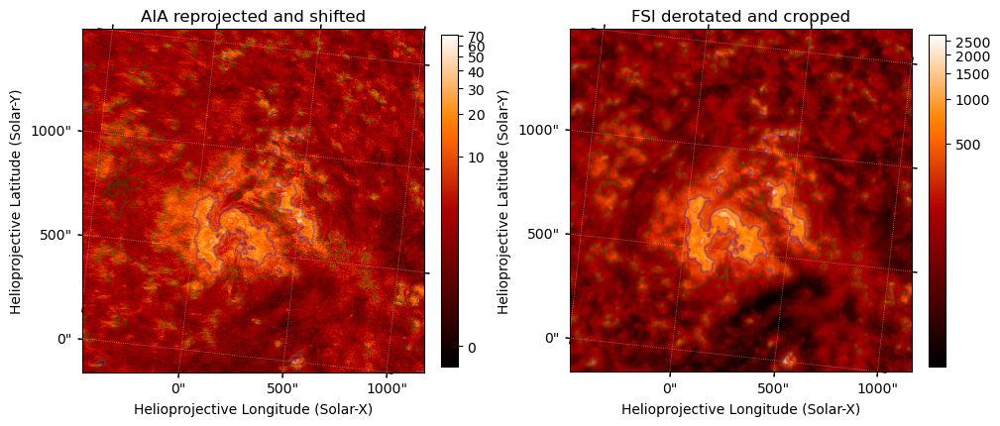

In [84]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro_shift)
im1 = aia_304_map_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA reprojected and shifted")

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("FSI derotated and cropped")

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [86]:
SunBlinker(aia_304_map_repro_shift, fsi_304_map_hri_time, reproject=True)

In [87]:
aia_1600_map_repro = aia_1600_map_shifted.reproject_to(fsi_304_crop.wcs)

In [88]:
aia_1600_map_repro_shift = aia_1600_map_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)

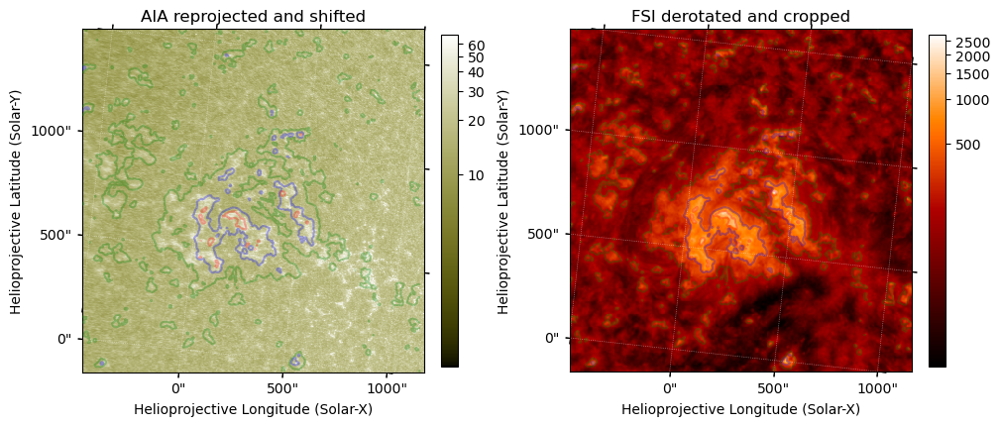

In [89]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_1600_map_repro_shift)
im1 = aia_1600_map_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA reprojected and shifted")

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("FSI derotated and cropped")

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [90]:
aia_171_repro = aia_171_map.reproject_to(fsi_304_crop.wcs)
aia_171_repro_shift = aia_171_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)

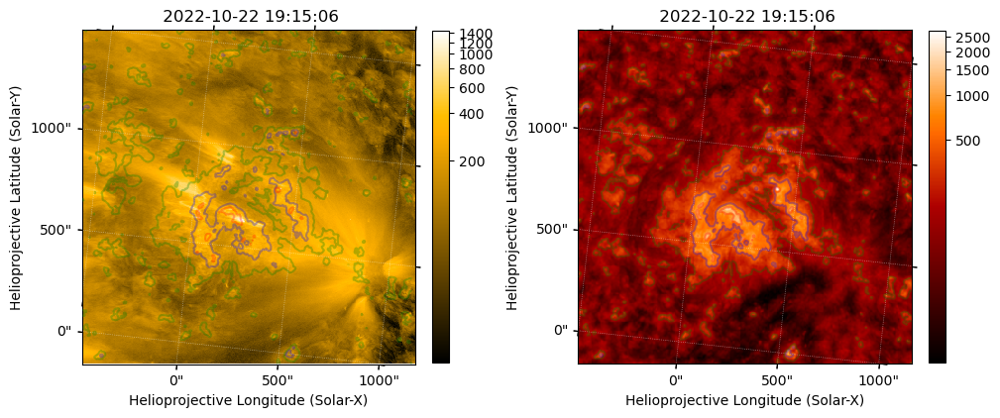

In [91]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_171_repro_shift)
im1 = aia_171_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

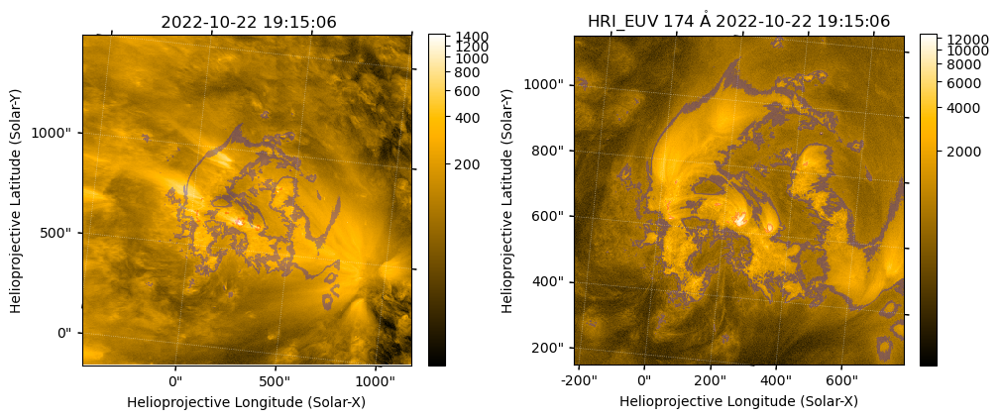

In [92]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_171_repro_shift)
im1 = aia_171_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [93]:
aia_171_repro_shift_hrifov = aia_171_repro_shift.reproject_to(hri_174_map_shifted.wcs)

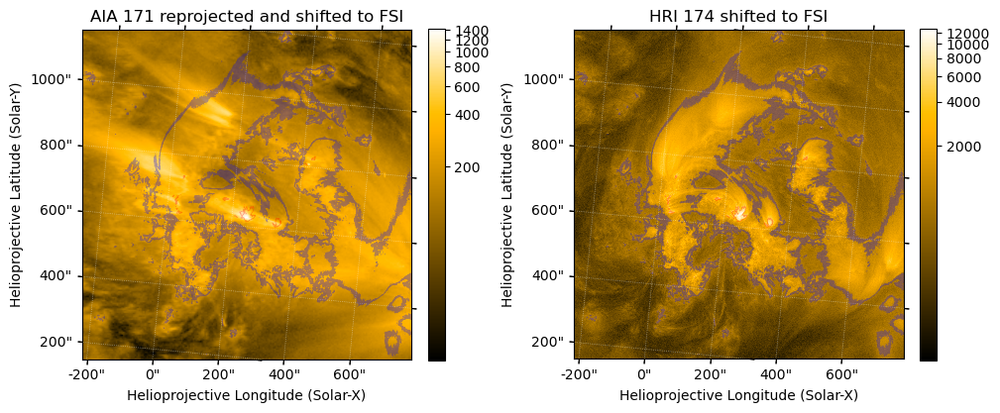

In [94]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_171_repro_shift_hrifov)
im1 = aia_171_repro_shift_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA 171 reprojected and shifted to FSI")

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("HRI 174 shifted to FSI")

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [95]:
SunBlinker(aia_171_repro_shift_hrifov, hri_174_map_shifted)

In [ ]:
aia_193_repro = aia_193_map.reproject_to(fsi_304_crop.wcs)
aia_193_repro_shift = aia_193_repro.shift_reference_coord(Txshift_aia_fsi,Tyshift_aia_fsi)
aia_193_repro_shift_hrifov = aia_193_repro_shift.reproject_to(hri_174_map_shifted.wcs)

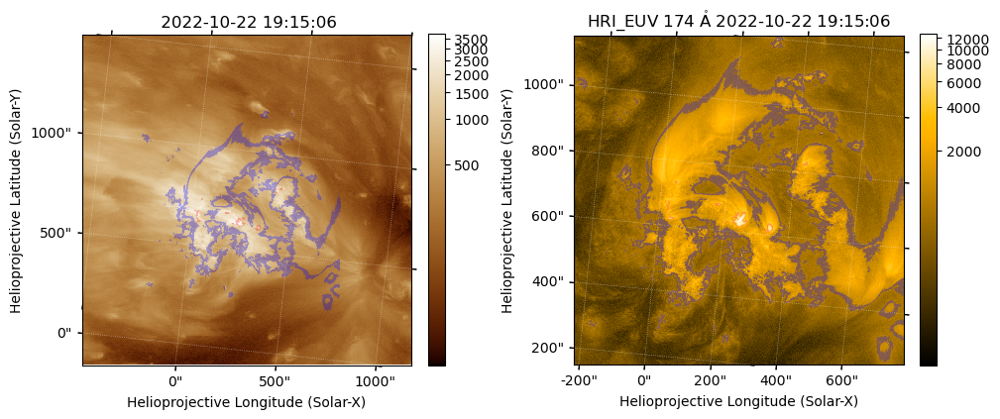

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_repro_shift)
im1 = aia_193_repro_shift.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

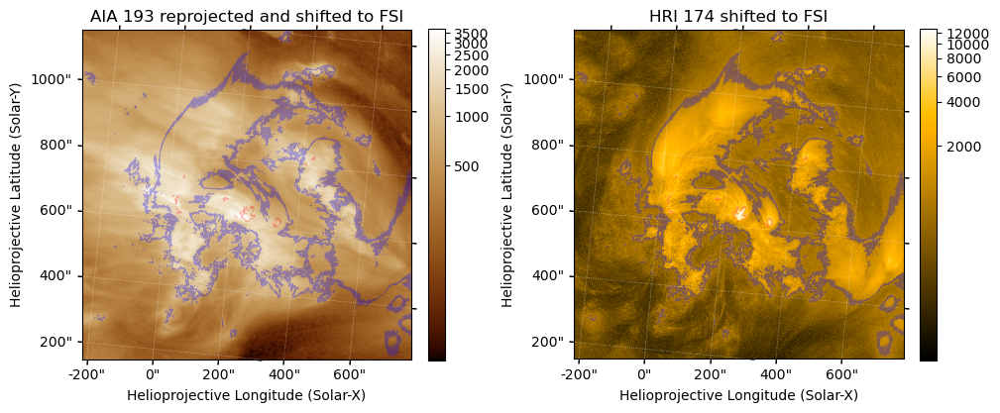

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_193_repro_shift_hrifov)
im1 = aia_193_repro_shift_hrifov.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA 193 reprojected and shifted to FSI")

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("HRI 174 shifted to FSI")

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3,linewidths=0.5)
    ax_.axis(bounds)

In [ ]:
def repro_aia_hri(aia_map,hri_map,algorithm="exact"):
    # out_frame = Helioprojective(observer='earth', obstime=hri_map.date,
    #                     rsun=aia_map.coordinate_frame.rsun)
    # out_center = SkyCoord(0*u.arcsec, 0*u.arcsec, frame=out_frame)
    # header = sunpy.map.make_fitswcs_header(aia_map.data.shape,
    #                                     out_center,
    #                                     scale=u.Quantity(aia_map.scale))
    # out_wcs = WCS(header)

    # with propagate_with_solar_surface():
    #     aia_map_hri_time = aia_map.reproject_to(out_wcs,algorithm=algorithm)

    # aia_map_repro = aia_map_hri_time.reproject_to(hri_map.wcs,algorithm="exact")

    aia_map_repro = aia_map.reproject_to(hri_map.wcs,algorithm=algorithm)

    return aia_map_repro


In [ ]:
aia_193_map_repro = repro_aia_hri(aia_193_map,hri_174_map)

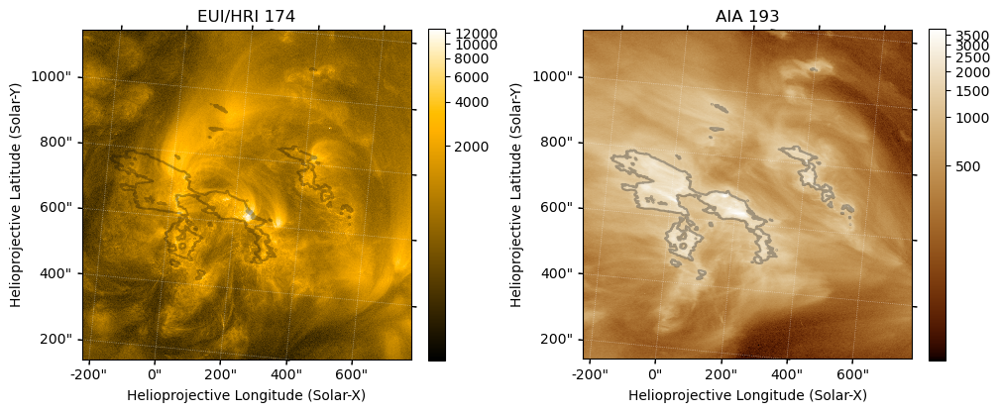

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=hri_174_map)
hri_174_map.plot(axes=ax1, title='hri/HRI 174')
plt.colorbar(ax=ax1,shrink=0.75)


ax2 = fig.add_subplot(122,projection=hri_174_map)
aia_193_map_repro.plot(axes=ax2, title='AIA 193')
plt.colorbar(ax=ax2,shrink=0.75)

aia_193_levels = [1500]
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_193_map_repro.draw_contours(aia_193_levels, axes=ax_, cmap=cmcm.batlowK, alpha=0.3)
    ax_.axis(bounds)

In [ ]:
aia_171_map_repro = repro_aia_hri(aia_171_map,hri_174_map)

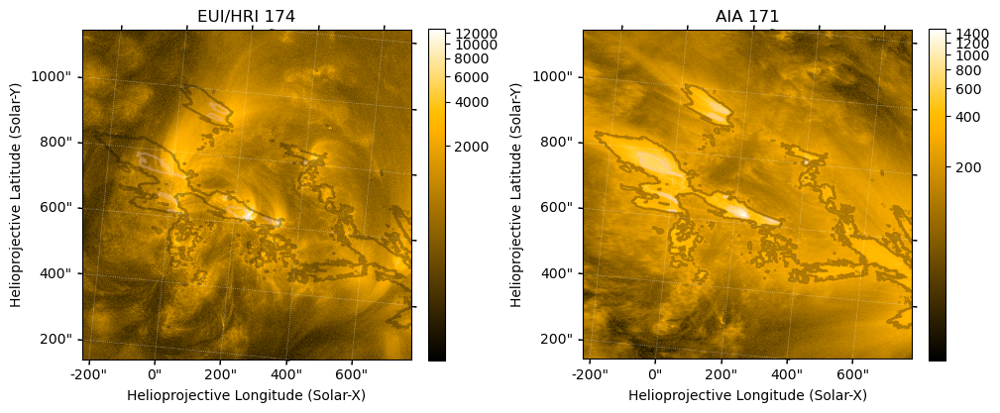

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=hri_174_map)
hri_174_map.plot(axes=ax1, title='hri/HRI 174')
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map)
aia_171_map_repro.plot(axes=ax2, title='AIA 171',autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

aia_171_levels = [300,600]
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_171_map_repro.draw_contours(aia_171_levels, axes=ax_, cmap=cmcm.batlowK, alpha=0.3)
    ax_.axis(bounds)

In [ ]:
aia_304_map_repro = repro_aia_hri(aia_304_map,hri_174_map)

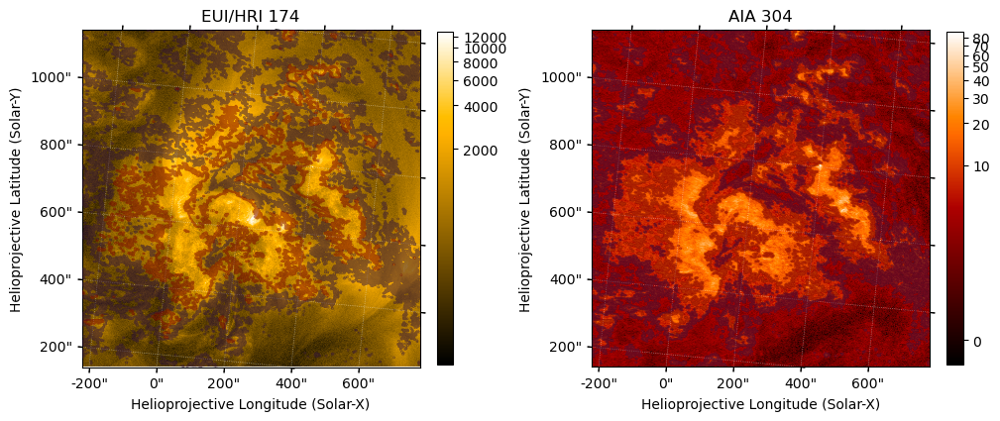

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=hri_174_map)
hri_174_map.plot(axes=ax1, title='hri/HRI 174')
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map)
aia_304_map_repro.plot(axes=ax2, title='AIA 304',autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

aia_304_levels = [5,10]
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_304_map_repro.draw_contours(aia_304_levels, axes=ax_, cmap="turbo", alpha=0.5)
    ax_.axis(bounds)

In [ ]:
aia_1600_map_repro = repro_aia_hri(aia_1600_map,hri_174_map)

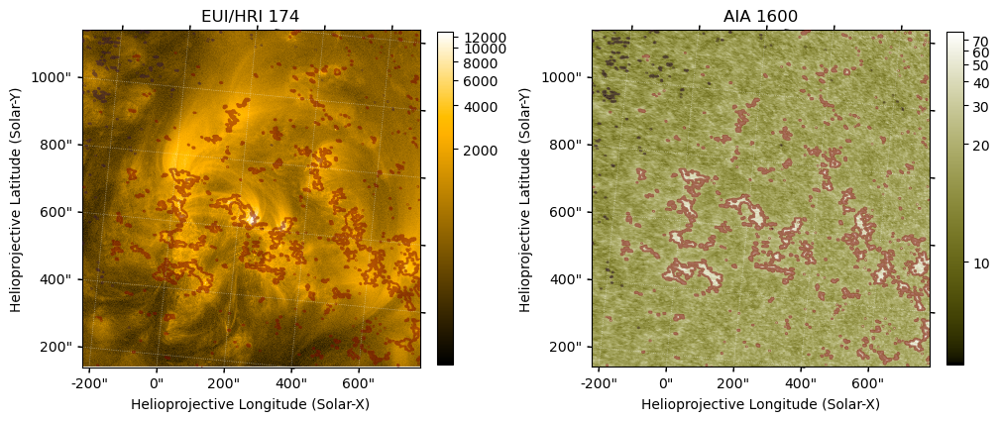

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=hri_174_map)
hri_174_map.plot(axes=ax1, title='hri/HRI 174')
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map)
aia_1600_map_repro.plot(axes=ax2, title='AIA 1600',autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

aia_1600_levels = [10,30]
for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    aia_1600_map_repro.draw_contours(aia_1600_levels, axes=ax_, cmap="turbo", alpha=0.5)
    ax_.axis(bounds)

In [ ]:
hmi_los_map_repro = repro_aia_hri(hmi_los_map_to_aia,hri_174_map)

In [ ]:
phi_los_map_repro = phi_los_map.reproject_to(hri_174_map.wcs)

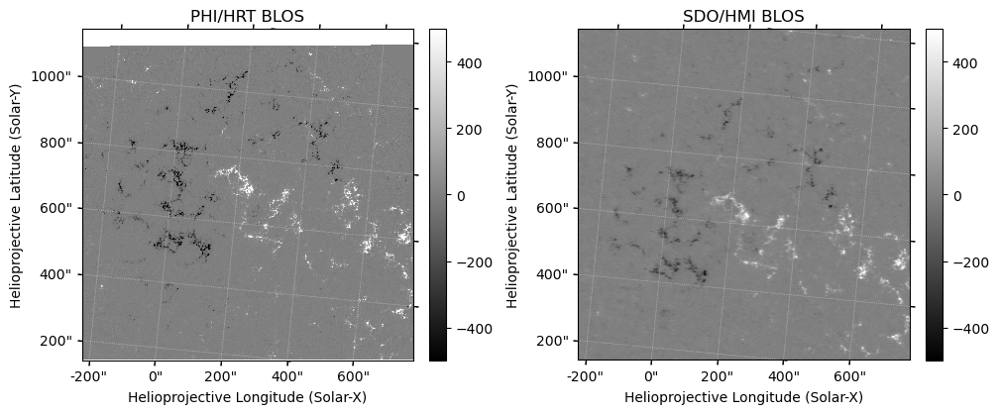

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_repro)
phi_los_map_repro.plot(axes=ax1, title='PHI/HRT BLOS',norm=plt.Normalize(-500, 500))
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=phi_los_map_repro)
hmi_los_map_repro.plot(axes=ax2, title='SDO/HMI BLOS',norm=plt.Normalize(-500, 500),autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

In [ ]:
phi_los_map_repro_crop = phi_los_map_repro.submap(SkyCoord(0*u.arcsec,400*u.arcsec,frame=phi_los_map_repro.coordinate_frame),
                                        top_right=SkyCoord(600*u.arcsec,1000*u.arcsec,frame=phi_los_map_repro.coordinate_frame))

hmi_los_map_repro_crop = hmi_los_map_repro.submap(SkyCoord(0*u.arcsec,400*u.arcsec,frame=hmi_los_map_repro.coordinate_frame),
                                        top_right=SkyCoord(600*u.arcsec,1000*u.arcsec,frame=hmi_los_map_repro.coordinate_frame))

In [ ]:
yshift_phi, xshift_phi = coalignment._calculate_shift(hmi_los_map_repro.data,phi_los_map_repro_crop.data)

In [ ]:
reference_coord_phi = hmi_los_map_repro.pixel_to_world(xshift_phi, yshift_phi)
Txshift_phi = reference_coord_phi.Tx - phi_los_map_repro_crop.bottom_left_coord.Tx
Tyshift_phi = reference_coord_phi.Ty - phi_los_map_repro_crop.bottom_left_coord.Ty
print(Txshift_phi)
print(Tyshift_phi)
phi_los_map_repro_crop_shift = phi_los_map_repro_crop.shift_reference_coord(Txshift_phi,Tyshift_phi)
phi_los_map_repro_shift = phi_los_map_repro.shift_reference_coord(Txshift_phi,Tyshift_phi)
phi_los_map_repro_shift_repro = repro_aia_hri(phi_los_map_repro_shift,hri_174_map)

6.20511 arcsec
-77.4193 arcsec


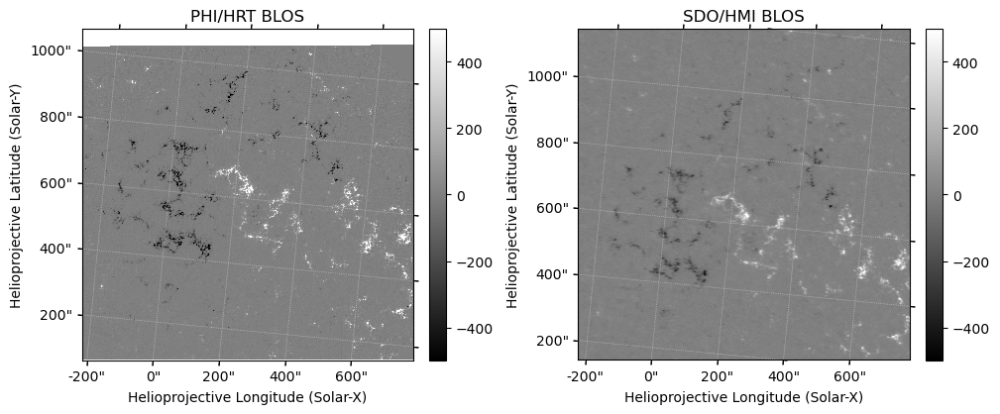

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_repro_shift)
phi_los_map_repro_shift.plot(axes=ax1, title='PHI/HRT BLOS',norm=plt.Normalize(-500, 500))
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=phi_los_map_repro)
hmi_los_map_repro.plot(axes=ax2, title='SDO/HMI BLOS',norm=plt.Normalize(-500, 500),autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

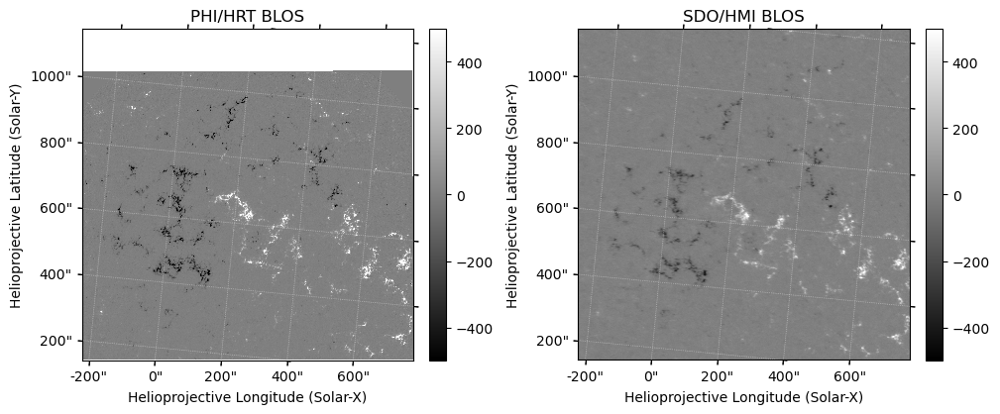

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_repro_shift_repro)
phi_los_map_repro_shift_repro.plot(axes=ax1, title='PHI/HRT BLOS',norm=plt.Normalize(-500, 500))
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=phi_los_map_repro)
hmi_los_map_repro.plot(axes=ax2, title='SDO/HMI BLOS',norm=plt.Normalize(-500, 500),autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

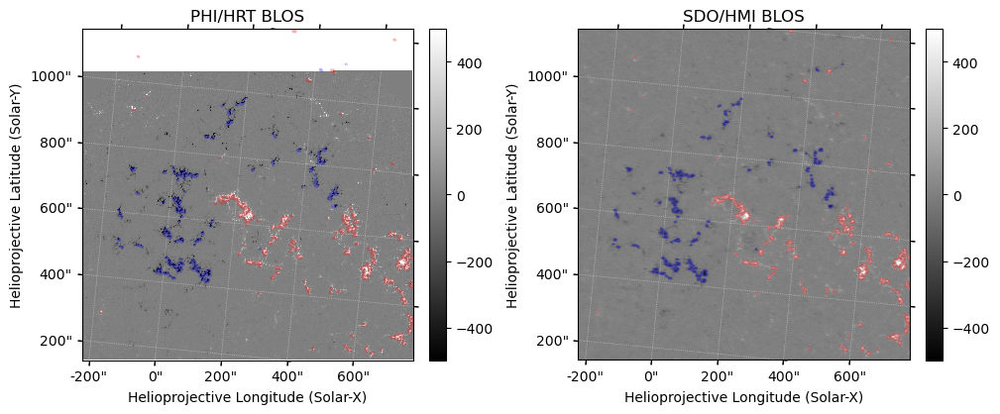

In [ ]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=phi_los_map_repro_shift_repro)
phi_los_map_repro_shift_repro.plot(axes=ax1, title='PHI/HRT BLOS',norm=plt.Normalize(-500, 500))
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hmi_los_map_repro)
hmi_los_map_repro.plot(axes=ax2, title='SDO/HMI BLOS',norm=plt.Normalize(-500, 500),autoalign=True)
plt.colorbar(ax=ax2,shrink=0.75)

hmi_los_levels = [-150,150]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hmi_los_map_repro.draw_contours(hmi_los_levels,axes=ax_, colors=["b","r"], alpha=0.3,zorder=10)
    ax_.axis(bounds)